## Template
이 노트는 torchvision에서 pretrained model들을 적용하기 위한 베이스 코드(template)입니다.

In [ ]:
#@title Import Module
import os
import cv2
import csv
import glob
import json
import random
import kagglehub
import numpy as np
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import pandas as pd
import xml.etree.ElementTree as ET

import torch
import torchvision

from collections import defaultdict
from torchvision import tv_tensors
from torchvision.transforms import v2
from torchvision.transforms import functional as F
from torch.utils.data import Dataset, DataLoader
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torchvision.models.detection.ssd import SSD300_VGG16_Weights
from torchvision.models.detection.ssd import SSDClassificationHead
from torchvision.models.detection import _utils as det_utils
from sklearn.model_selection import train_test_split
from sklearn.metrics import average_precision_score
from PIL import Image
from tqdm import tqdm

from functools import partial

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.fcos import FCOSClassificationHead
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.models.detection.ssdlite import SSDLiteClassificationHead
from torchvision.models.detection.ssd import SSD300_VGG16_Weights, SSDClassificationHead
from torchvision.models.detection import (
    FCOS_ResNet50_FPN_Weights,
    FasterRCNN_MobileNet_V3_Large_320_FPN_Weights,
    FasterRCNN_MobileNet_V3_Large_FPN_Weights,
    FasterRCNN_ResNet50_FPN_V2_Weights,
    FasterRCNN_ResNet50_FPN_Weights,
    RetinaNet_ResNet50_FPN_V2_Weights,
    RetinaNet_ResNet50_FPN_Weights,
    SSDLite320_MobileNet_V3_Large_Weights,
)
from torchvision.models.detection import _utils as det_utils

In [ ]:
#@title Set Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [ ]:
#@title Image, Annotation 경로 설정
kagglehub.login()
path = kagglehub.competition_download("ai14-level-project")
path = os.path.join(path, "sprint_ai_project1_data")
print(path)

image_dir = glob.glob(os.path.join(path, "train_images", "*.png"))

annotation_dir = glob.glob(
    os.path.join(path, "train_annotations", "**", "*.json"),
    recursive=True
)

print(f"Train 이미지 수 : {len(image_dir)}, Annotation 수 : {len(annotation_dir)}")

C:\Users\yiydg\.cache\kagglehub\competitions\ai14-level-project\sprint_ai_project1_data
Train 이미지 수 : 232, Annotation 수 : 763


In [ ]:
print("반환된 원본 path:", path)

raw_path = kagglehub.competition_download("ai14-level-project")
print("kagglehub 원본 다운로드 경로:", raw_path)
print("그 안의 내용물:", os.listdir(raw_path))

반환된 원본 path: C:\Users\yiydg\.cache\kagglehub\competitions\ai14-level-project\sprint_ai_project1_data
kagglehub 원본 다운로드 경로: C:\Users\yiydg\.cache\kagglehub\competitions\ai14-level-project
그 안의 내용물: ['sprint_ai_project1_data']


In [ ]:
print("path 안의 내용물:", os.listdir(path))

path 안의 내용물: ['test_images', 'train_annotations', 'train_images']


In [ ]:
print("train_images 안:", os.listdir(os.path.join(path, "train_images"))[:5])
print("train_annotations 안:", os.listdir(os.path.join(path, "train_annotations"))[:5])

train_images 안: ['K-001900-016548-019607-029451_0_2_0_2_70_000_200.png', 'K-001900-016548-019607-029451_0_2_0_2_75_000_200.png', 'K-001900-016548-019607-029451_0_2_0_2_90_000_200.png', 'K-001900-016548-019607-033009_0_2_0_2_70_000_200.png', 'K-001900-016548-019607-033009_0_2_0_2_75_000_200.png']
train_annotations 안: ['K-001900-016548-019607-029451_json', 'K-001900-016548-019607-033009_json', 'K-001900-016548-021771-027926_json', 'K-001900-016548-024850-029345_json', 'K-001900-016551-029345-033208_json']


In [ ]:
sample_folder = os.path.join(path, "train_annotations", "K-001900-016548-019607-029451_json")
print("이게 폴더인가?", os.path.isdir(sample_folder))
print("그 안의 내용물:", os.listdir(sample_folder))

이게 폴더인가? True
그 안의 내용물: ['K-001900', 'K-016548', 'K-019607', 'K-029451']


In [ ]:
deeper = os.path.join(sample_folder, "K-001900")
print("이게 폴더인가?", os.path.isdir(deeper))
print("그 안의 내용물:", os.listdir(deeper))

이게 폴더인가? True
그 안의 내용물: ['K-001900-016548-019607-029451_0_2_0_2_70_000_200.json', 'K-001900-016548-019607-029451_0_2_0_2_75_000_200.json', 'K-001900-016548-019607-029451_0_2_0_2_90_000_200.json']


In [ ]:
test_glob = glob.glob(os.path.join(path, "train_annotations", "**", "*.json"), recursive=True)
print("찾은 json 개수:", len(test_glob))
print("샘플:", test_glob[:3])

찾은 json 개수: 763
샘플: ['C:\\Users\\yiydg\\.cache\\kagglehub\\competitions\\ai14-level-project\\sprint_ai_project1_data\\train_annotations\\K-001900-016548-019607-029451_json\\K-001900\\K-001900-016548-019607-029451_0_2_0_2_70_000_200.json', 'C:\\Users\\yiydg\\.cache\\kagglehub\\competitions\\ai14-level-project\\sprint_ai_project1_data\\train_annotations\\K-001900-016548-019607-029451_json\\K-001900\\K-001900-016548-019607-029451_0_2_0_2_75_000_200.json', 'C:\\Users\\yiydg\\.cache\\kagglehub\\competitions\\ai14-level-project\\sprint_ai_project1_data\\train_annotations\\K-001900-016548-019607-029451_json\\K-001900\\K-001900-016548-019607-029451_0_2_0_2_90_000_200.json']


In [ ]:
# 1) kagglehub로 새 path 받기
path = kagglehub.competition_download("ai14-level-project")
path = os.path.join(path, "sprint_ai_project1_data")
print(path)

# 2) 새 path 기준으로 image_dir, annotation_dir 다시 만들기 (반드시 이 순서로!)
image_dir = glob.glob(os.path.join(path, "train_images", "*.png"))
annotation_dir = glob.glob(
    os.path.join(path, "train_annotations", "**", "*.json"),
    recursive=True
)

print(f"Train 이미지 수 : {len(image_dir)}, Annotation 수 : {len(annotation_dir)}")

C:\Users\yiydg\.cache\kagglehub\competitions\ai14-level-project\sprint_ai_project1_data
Train 이미지 수 : 232, Annotation 수 : 763


In [ ]:
# #@title Image-Annotation Mapping

# # Train 이미지에 해당하지 않는 Annotation 개수 확인
# annotation_not_in_train_image = []
# for image_path in image_dir:
#     image_name = os.path.basename(image_path)
#     annotation_name = image_name.replace(".png", ".json")
#     if annotation_name not in [os.path.basename(annotation_path) for annotation_path in annotation_dir]:
#         annotation_not_in_train_image.append(image_name)

# print(f"Annotation에 해당하지 않는 Train 이미지 개수: {len(annotation_not_in_train_image)}")

# # Annotation 에 없는 Train 이미지 개수 확인
# train_image_not_in_annotation = []
# for annotation_path in annotation_dir:
#     annotation_name = os.path.basename(annotation_path)
#     image_name = annotation_name.replace(".json", ".png")
#     if image_name not in [os.path.basename(image_path) for image_path in image_dir]:
#         train_image_not_in_annotation.append(annotation_name)

# print(f"Train 이미지에 해당하지 않는 Annotation 개수: {len(train_image_not_in_annotation)}")

# # Train 이미지와 Annotation 매핑 가능한 데이터 수
# image_annotation_mapping = {}
# for image_path in image_dir:
#     image_name = os.path.basename(image_path)
#     annotation_name = image_name.replace(".png", ".json")
#     if annotation_name in [os.path.basename(annotation_path) for annotation_path in annotation_dir]:
#         image_annotation_mapping[image_name] = annotation_name

# print(f"Train 이미지와 Annotation 매핑 가능한 데이터 수: {len(image_annotation_mapping)}")

# # Image - Annotation Mapping을 위한 코드
# image_names = [os.path.basename(image_path) for image_path in image_dir]
# annotation_names = [os.path.basename(annotation_path) for annotation_path in annotation_dir]

# image_annotation_mapping_process = {}
# for image_name in image_names:
#     annotation_name = image_name.replace(".png", ".json")
#     if annotation_name in annotation_names:
#         image_annotation_mapping_process[image_name] = annotation_name

In [ ]:
#@title Annotation 경로 매핑 (중복 대응)
# annotation_path_by_stem = {}
# duplicate_mismatch = []

# for ann_path in annotation_dir:
#     stem = os.path.splitext(os.path.basename(ann_path))[0]
#     if stem in annotation_path_by_stem:
#         # 중복 파일이 내용까지 같은지 확인
#         with open(annotation_path_by_stem[stem], "r", encoding="utf-8") as f1, open(ann_path, "r", encoding="utf-8") as f2:
#             if f1.read() != f2.read():
#                 duplicate_mismatch.append(stem)
#     else:
#         annotation_path_by_stem[stem] = ann_path

# print(f"고유 annotation stem 수: {len(annotation_path_by_stem)}")
# print(f"내용이 다른 중복 파일 수: {len(duplicate_mismatch)}")
# if duplicate_mismatch:
#     print("확인 필요:", duplicate_mismatch[:10])

In [ ]:
#@title 중복 annotation 내용 진단
# stem_to_paths = defaultdict(list)
# for ann_path in annotation_dir:
#     stem = os.path.splitext(os.path.basename(ann_path))[0]
#     stem_to_paths[stem].append(ann_path)

# # 확인 필요 목록 중 하나 골라서 상세 비교
# sample_stem = "K-003351-016232-033880_0_2_0_2_75_000_200"
# sample_paths = stem_to_paths[sample_stem]

# print(f"'{sample_stem}' 관련 파일 개수: {len(sample_paths)}")
# for p in sample_paths:
#     with open(p, "r", encoding="utf-8") as f:
#         data = json.load(f)
#     ann_summaries = [(a["id"], a["category_id"], a["bbox"]) for a in data["annotations"]]
#     cat_names = [c["name"] for c in data["categories"]]
#     print("---")
#     print("경로:", p)
#     print("categories:", cat_names)
#     print("annotations (id, category_id, bbox):", ann_summaries)

In [ ]:
#@title Annotation 경로 매핑 (stem -> 여러 파일)
# stem_to_paths = defaultdict(list)
# for ann_path in annotation_dir:
#     stem = os.path.splitext(os.path.basename(ann_path))[0]
#     stem_to_paths[stem].append(ann_path)

# avg_per_stem = sum(len(v) for v in stem_to_paths.values()) / len(stem_to_paths)
# print(f"고유 이미지 수: {len(stem_to_paths)}, 이미지당 평균 annotation 파일 수: {avg_per_stem:.2f}")

In [ ]:
#@title Check Unique Image Size
# shapes = set()

# for img_path in image_dir:  # 이미 전체 경로이므로 그대로 사용
#     img_pil = Image.open(img_path)
#     img_np = np.array(img_pil)
#     shapes.add(img_np.shape)

# print(f"Unique Image Shapes ({len(shapes)}종류):")
# for s in shapes:
#     print(s)

In [ ]:
#Cell 4 수정(1:1 mapping 코드 -> 1:n mapping 코드)
#@title Image-Annotation Mapping (stem 기준)

# 이미지 stem -> 이미지 경로
image_stem_to_path = {
    os.path.splitext(os.path.basename(image_path))[0]: image_path
    for image_path in image_dir
}

# 이미지 stem -> 여러 annotation JSON 경로
stem_to_paths = defaultdict(list)

for annotation_path in annotation_dir:
    stem = os.path.splitext(os.path.basename(annotation_path))[0]
    stem_to_paths[stem].append(annotation_path)

# 이미지와 annotation이 모두 존재하는 stem만 사용
valid_stems = [
    stem
    for stem in stem_to_paths
    if stem in image_stem_to_path
]

# 매핑되지 않는 데이터 확인
images_without_annotation = (
    set(image_stem_to_path) - set(stem_to_paths)
)

annotations_without_image = (
    set(stem_to_paths) - set(image_stem_to_path)
)

print(f"Annotation이 없는 Train 이미지 수: {len(images_without_annotation)}")
print(f"Train 이미지가 없는 Annotation stem 수: {len(annotations_without_image)}")
print(f"매핑 가능한 이미지 수: {len(valid_stems)}")

Annotation이 없는 Train 이미지 수: 0
Train 이미지가 없는 Annotation stem 수: 0
매핑 가능한 이미지 수: 232


In [ ]:
#@title Annotation 경로 매핑 (stem -> 여러 파일)
avg_per_stem = sum(len(v) for v in stem_to_paths.values()) / len(stem_to_paths)

print(
    f"고유 이미지 수: {len(stem_to_paths)}, "
    f"이미지당 평균 annotation 파일 수: {avg_per_stem:.2f}"
)

고유 이미지 수: 232, 이미지당 평균 annotation 파일 수: 3.29


In [ ]:
#@title 폴더별 partial annotation 병합
# def load_merged_annotation(paths):
#     img_info = None
#     boxes, labels, areas, iscrowd = [], [], [], []

#     for p in paths:
#         with open(p, "r", encoding="utf-8") as f:
#             data = json.load(f)

#         if img_info is None:
#             img_info = data["images"][0]  # width/height/file_name은 모든 폴더에서 동일하다고 가정

#         for ann in data["annotations"]:
#             boxes.append(ann["bbox"])       # [x, y, w, h]
#             labels.append(ann["category_id"])
#             areas.append(ann["area"])
#             iscrowd.append(ann.get("iscrowd", 0))

#     return img_info, boxes, labels, areas, iscrowd

In [ ]:
#@title 이미지 단위 Annotation 병합

def build_image_records(valid_stems, stem_to_paths):
    image_records = {}
    category_id_to_name = {}

    for stem in valid_stems:
        img_info = None
        annotations = []

        for annotation_path in stem_to_paths[stem]:
            with open(annotation_path, "r", encoding="utf-8") as f:
                data = json.load(f)

            # 이미지 정보는 같은 stem의 JSON끼리 동일하므로 처음 한 번만 저장
            if img_info is None:
                img_info = data["images"][0]

            # 클래스 정보 저장
            for category in data["categories"]:
                category_id_to_name[category["id"]] = category["name"]

            # 같은 이미지에 속한 annotation들을 하나로 병합
            for ann in data["annotations"]:
                annotations.append({
                    "bbox": ann["bbox"],
                    "category_id": ann["category_id"],
                    "area": ann["area"],
                    "iscrowd": ann.get("iscrowd", 0)
                })

        image_records[stem] = {
            "file_name": img_info["file_name"],
            "width": img_info["width"],
            "height": img_info["height"],
            "annotations": annotations
        }

    return image_records, category_id_to_name


image_records, category_id_to_name = build_image_records(
    valid_stems,
    stem_to_paths
)

print(f"이미지 record 수: {len(image_records)}")
print(f"클래스 수: {len(category_id_to_name)}")

이미지 record 수: 232
클래스 수: 56


In [ ]:
#@title 이미지 해상도 파악
sizes = set()
for img_path in image_dir[:50]:  # 200장이면 전수 조사해도 됨: image_dir 전체로
    with Image.open(img_path) as im:
        sizes.add(im.size)  # (width, height)

print(f"고유 해상도 종류 수: {len(sizes)}")
print(sizes if len(sizes) < 10 else list(sizes)[:10])

고유 해상도 종류 수: 1
{(976, 1280)}


In [ ]:
#@title transformer 정의
train_transformer = v2.Compose([
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.RandomHorizontalFlip(p=0.5),
])

val_test_transformer = v2.Compose([
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
])

In [ ]:
#@title 클래스(category) 매핑 생성
# def build_category_mapping(annotation_paths):
#     category_id_to_name = {}
#     for path in annotation_paths:
#         with open(path, "r", encoding="utf-8") as f:
#             data = json.load(f)
#         for cat in data["categories"]:
#             category_id_to_name[cat["id"]] = cat["name"]
#     return category_id_to_name

# category_id_to_name = build_category_mapping(annotation_dir)  # annotation_dir: glob으로 뽑은 json 경로 리스트
# sorted_ids = sorted(category_id_to_name.keys())

# category_to_label = {cid: i + 1 for i, cid in enumerate(sorted_ids)}  # 0 = background
# label_to_category = {v: k for k, v in category_to_label.items()}
# classes = ["background"] + [category_id_to_name[cid] for cid in sorted_ids]
# num_classes = len(classes)

# print(f"클래스 수(background 포함): {num_classes}")

In [ ]:
#@title 클래스(category) 매핑 생성
sorted_ids = sorted(category_id_to_name.keys())

category_to_label = {
    cid: i + 1
    for i, cid in enumerate(sorted_ids)
}

label_to_category = {
    v: k
    for k, v in category_to_label.items()
}

classes = ["background"] + [
    category_id_to_name[cid]
    for cid in sorted_ids
]

num_classes = len(classes)

print(f"클래스 수(background 포함): {num_classes}")

클래스 수(background 포함): 57


In [ ]:
#@title Pill Dataset 정의 (병합 버전)
# class PillDataset(Dataset):
#     def __init__(self, image_dir, stem_to_paths, stems, category_to_label, transforms=None):
#         self.image_dir = image_dir
#         self.stem_to_paths = stem_to_paths
#         self.stems = stems
#         self.category_to_label = category_to_label
#         self.transforms = transforms

#     def __len__(self):
#         return len(self.stems)

#     def __getitem__(self, idx):
#         stem = self.stems[idx]
#         paths = self.stem_to_paths[stem]

#         img_info, raw_boxes, raw_labels, areas, iscrowd = load_merged_annotation(paths)

#         image = Image.open(os.path.join(self.image_dir, img_info["file_name"])).convert("RGB")
#         w, h = img_info["width"], img_info["height"]

#         boxes = [[x, y, x + bw, y + bh] for x, y, bw, bh in raw_boxes]
#         labels = [self.category_to_label[cid] for cid in raw_labels]

#         image = tv_tensors.Image(image)
#         boxes = tv_tensors.BoundingBoxes(boxes, format="XYXY", canvas_size=(h, w))

#         target = {
#             "boxes": boxes,
#             "labels": torch.as_tensor(labels, dtype=torch.int64),
#             "image_id": torch.tensor([idx]),
#             "area": torch.as_tensor(areas, dtype=torch.float32),
#             "iscrowd": torch.as_tensor(iscrowd, dtype=torch.int64),
#         }

#         if self.transforms:
#             image, target = self.transforms(image, target)

#         return image, target

In [ ]:
#@title Pill Dataset 정의

class PillDataset(Dataset):
    def __init__(
        self,
        image_dir,
        image_records,
        stems,
        category_to_label,
        transforms=None
    ):
        self.image_dir = image_dir
        self.image_records = image_records
        self.stems = stems
        self.category_to_label = category_to_label
        self.transforms = transforms

    def __len__(self):
        return len(self.stems)

    def __getitem__(self, idx):
        stem = self.stems[idx]

        # 미리 병합해둔 annotation 정보 가져오기
        record = self.image_records[stem]

        image = Image.open(
            os.path.join(self.image_dir, record["file_name"])
        ).convert("RGB")

        w = record["width"]
        h = record["height"]

        boxes = []
        labels = []
        areas = []
        iscrowd = []

        for ann in record["annotations"]:
            x, y, bw, bh = ann["bbox"]

            boxes.append([x, y, x + bw, y + bh])
            labels.append(
                self.category_to_label[ann["category_id"]]
            )
            areas.append(ann["area"])
            iscrowd.append(ann["iscrowd"])

        image = tv_tensors.Image(image)

        boxes = tv_tensors.BoundingBoxes(
            boxes,
            format="XYXY",
            canvas_size=(h, w)
        )

        target = {
            "boxes": boxes,
            "labels": torch.as_tensor(labels, dtype=torch.int64),
            "image_id": torch.tensor([idx]),
            "area": torch.as_tensor(areas, dtype=torch.float32),
            "iscrowd": torch.as_tensor(iscrowd, dtype=torch.int64),
        }

        if self.transforms:
            image, target = self.transforms(image, target)

        return image, target

In [ ]:
#@title Dataset ~ DataLoader
# stems = list(stem_to_paths.keys())
# train_stems, valid_stems = train_test_split(stems, test_size=0.2, random_state=42)

# train_dataset = PillDataset(image_dir=os.path.join(path, "train_images"), stem_to_paths=stem_to_paths,
#                              stems=train_stems, category_to_label=category_to_label, transforms=train_transformer)
# valid_dataset = PillDataset(image_dir=os.path.join(path, "train_images"), stem_to_paths=stem_to_paths,
#                              stems=valid_stems, category_to_label=category_to_label, transforms=val_test_transformer)

# train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
# val_loader = DataLoader(valid_dataset, batch_size=8, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

In [ ]:
#@title Dataset ~ DataLoader
stems = list(stem_to_paths.keys())
train_stems, valid_stems = train_test_split(stems, test_size=0.2, random_state=42)

train_dataset = PillDataset(
    image_dir=os.path.join(path, "train_images"),
    image_records=image_records,
    stems=train_stems,
    category_to_label=category_to_label,
    transforms=train_transformer
)
valid_dataset = PillDataset(
    image_dir=os.path.join(path, "train_images"),
    image_records=image_records,
    stems=valid_stems,
    category_to_label=category_to_label,
    transforms=val_test_transformer
)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
val_loader = DataLoader(valid_dataset, batch_size=8, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

In [ ]:
#@title RetinaNet 모델 설정
model = torchvision.models.detection.retinanet_resnet50_fpn_v2(
    weights=RetinaNet_ResNet50_FPN_V2_Weights.DEFAULT,
).to(device)

# pretrained RetinaNet의 91-class 분류 head를
# 우리 데이터의 57-class head로 교체
in_channels = model.backbone.out_channels
num_anchors = model.anchor_generator.num_anchors_per_location()[0]

model.head.classification_head = RetinaNetClassificationHead(
    in_channels=in_channels,
    num_anchors=num_anchors,
    num_classes=num_classes,  # 여기에는 57을 넣는 것이 맞음
    norm_layer=partial(torch.nn.GroupNorm, 32),
).to(device)

CHECKPOINT_PATH = "best_model_retinanet_resnet50_fpn_v2.pth"

In [ ]:
#@title Define Optimizer & Scheduler
optimizer = torch.optim.SGD(
    model.parameters(),
    lr=3e-3,
    momentum=0.9,
    weight_decay=0.0005
)

lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=4,
)

In [ ]:
#@title mAP 계산 함수 (IoU threshold 0.75~0.95)
iou_thresholds = [0.75, 0.80, 0.85, 0.90, 0.95]

def evaluate_map(model, data_loader, device):
    model.eval()
    metric = MeanAveragePrecision(iou_type="bbox", iou_thresholds=iou_thresholds)

    with torch.no_grad():
        for images, targets in tqdm(data_loader, desc="Evaluating"):
            images = [img.to(device) for img in images]
            preds = model(images)

            preds_cpu = [{k: v.cpu() for k, v in p.items()} for p in preds]
            targets_cpu = [{"boxes": t["boxes"].cpu(), "labels": t["labels"].cpu()} for t in targets]

            metric.update(preds_cpu, targets_cpu)

    result = metric.compute()
    model.train()
    return result

In [ ]:
num_epochs = 30
best_map = 0.0
train_loss_hist = []
val_map_hist = []
val_map_75_hist = []

for epoch in range(num_epochs):
    model.train()
    total_train_loss = 0

    for images, targets in tqdm(train_loader, desc=f"Epoch {epoch+1} Training"):
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        total_train_loss += losses.item()

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

    avg_train_loss = total_train_loss / len(train_loader)

    val_map = evaluate_map(model, val_loader, device)
    current_map = val_map['map'].item()
    current_map_75 = val_map['map_75'].item()

    lr_scheduler.step(current_map)

    print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {avg_train_loss:.4f} "
          f"| mAP[.75:.95]: {current_map:.4f} "
          f"| mAP@75: {current_map_75:.4f}")

    train_loss_hist.append(avg_train_loss)
    val_map_hist.append(current_map)
    val_map_75_hist.append(current_map_75)

    if current_map > best_map:
        best_map = current_map
        torch.save(model.state_dict(), CHECKPOINT_PATH)
        print(f"  → New best model saved (mAP: {best_map:.4f})")

Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.02it/s]


Epoch 1/30 | Train Loss: 1.0081 | mAP[.75:.95]: 0.0340 | mAP@75: 0.0398
  → New best model saved (mAP: 0.0340)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.16it/s]


Epoch 2/30 | Train Loss: 0.6716 | mAP[.75:.95]: 0.1117 | mAP@75: 0.1286
  → New best model saved (mAP: 0.1117)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.12it/s]


Epoch 3/30 | Train Loss: 0.5248 | mAP[.75:.95]: 0.2437 | mAP@75: 0.2757
  → New best model saved (mAP: 0.2437)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.09it/s]


Epoch 4/30 | Train Loss: 0.4338 | mAP[.75:.95]: 0.2845 | mAP@75: 0.3117
  → New best model saved (mAP: 0.2845)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.10it/s]


Epoch 5/30 | Train Loss: 0.3789 | mAP[.75:.95]: 0.3639 | mAP@75: 0.4103
  → New best model saved (mAP: 0.3639)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.10it/s]


Epoch 6/30 | Train Loss: 0.3236 | mAP[.75:.95]: 0.3966 | mAP@75: 0.4461
  → New best model saved (mAP: 0.3966)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.13it/s]


Epoch 7/30 | Train Loss: 0.2645 | mAP[.75:.95]: 0.5319 | mAP@75: 0.5980
  → New best model saved (mAP: 0.5319)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.12it/s]


Epoch 8/30 | Train Loss: 0.2355 | mAP[.75:.95]: 0.5659 | mAP@75: 0.6418
  → New best model saved (mAP: 0.5659)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.09it/s]


Epoch 9/30 | Train Loss: 0.2050 | mAP[.75:.95]: 0.6137 | mAP@75: 0.6871
  → New best model saved (mAP: 0.6137)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.13it/s]


Epoch 10/30 | Train Loss: 0.1970 | mAP[.75:.95]: 0.6339 | mAP@75: 0.6918
  → New best model saved (mAP: 0.6339)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.12it/s]


Epoch 11/30 | Train Loss: 0.1823 | mAP[.75:.95]: 0.6480 | mAP@75: 0.7034
  → New best model saved (mAP: 0.6480)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.10it/s]


Epoch 12/30 | Train Loss: 0.1577 | mAP[.75:.95]: 0.6551 | mAP@75: 0.7123
  → New best model saved (mAP: 0.6551)


Evaluating: 100%|██████████| 6/6 [00:06<00:00,  1.09s/it]


Epoch 13/30 | Train Loss: 0.1560 | mAP[.75:.95]: 0.6818 | mAP@75: 0.7631
  → New best model saved (mAP: 0.6818)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.15it/s]


Epoch 14/30 | Train Loss: 0.1369 | mAP[.75:.95]: 0.7019 | mAP@75: 0.7619
  → New best model saved (mAP: 0.7019)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.12it/s]


Epoch 15/30 | Train Loss: 0.1224 | mAP[.75:.95]: 0.7251 | mAP@75: 0.8011
  → New best model saved (mAP: 0.7251)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.13it/s]


Epoch 16/30 | Train Loss: 0.1157 | mAP[.75:.95]: 0.7302 | mAP@75: 0.7745
  → New best model saved (mAP: 0.7302)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.14it/s]


Epoch 17/30 | Train Loss: 0.1398 | mAP[.75:.95]: 0.6988 | mAP@75: 0.7864


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.15it/s]


Epoch 18/30 | Train Loss: 0.1150 | mAP[.75:.95]: 0.7627 | mAP@75: 0.8030
  → New best model saved (mAP: 0.7627)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.16it/s]


Epoch 19/30 | Train Loss: 0.1024 | mAP[.75:.95]: 0.7593 | mAP@75: 0.7975


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.13it/s]


Epoch 20/30 | Train Loss: 0.0994 | mAP[.75:.95]: 0.7832 | mAP@75: 0.8578
  → New best model saved (mAP: 0.7832)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.14it/s]


Epoch 21/30 | Train Loss: 0.0998 | mAP[.75:.95]: 0.7611 | mAP@75: 0.8122


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.16it/s]


Epoch 22/30 | Train Loss: 0.0925 | mAP[.75:.95]: 0.7885 | mAP@75: 0.8389
  → New best model saved (mAP: 0.7885)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.11it/s]


Epoch 23/30 | Train Loss: 0.0875 | mAP[.75:.95]: 0.7827 | mAP@75: 0.8300


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.15it/s]


Epoch 24/30 | Train Loss: 0.0845 | mAP[.75:.95]: 0.7690 | mAP@75: 0.8467


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.12it/s]


Epoch 25/30 | Train Loss: 0.0796 | mAP[.75:.95]: 0.7870 | mAP@75: 0.8394


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.12it/s]


Epoch 26/30 | Train Loss: 0.0775 | mAP[.75:.95]: 0.8267 | mAP@75: 0.8858
  → New best model saved (mAP: 0.8267)


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.13it/s]


Epoch 27/30 | Train Loss: 0.0760 | mAP[.75:.95]: 0.8249 | mAP@75: 0.8914


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.12it/s]


Epoch 28/30 | Train Loss: 0.0734 | mAP[.75:.95]: 0.8060 | mAP@75: 0.8687


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.16it/s]


Epoch 29/30 | Train Loss: 0.0707 | mAP[.75:.95]: 0.8188 | mAP@75: 0.8687


Evaluating: 100%|██████████| 6/6 [00:05<00:00,  1.13it/s]

Epoch 30/30 | Train Loss: 0.0690 | mAP[.75:.95]: 0.8214 | mAP@75: 0.8695


In [ ]:
#@title Test 이미지 경로 설정 및 랜덤 샘플링
test_image_dir = glob.glob(os.path.join(path, "test_images", "*.png"))
print(f"Test 이미지 수: {len(test_image_dir)}")

random.seed(42)
test_sample_paths = random.sample(test_image_dir, min(20, len(test_image_dir)))
test_sample_stems = [os.path.splitext(os.path.basename(p))[0] for p in test_sample_paths]

Test 이미지 수: 842


In [ ]:
#@title TestDataset 정의
class TestDataset(Dataset):
    def __init__(self, image_dir, stems, transforms):
        self.image_dir = image_dir
        self.stems = stems
        self.transforms = transforms

    def __len__(self):
        return len(self.stems)

    def __getitem__(self, idx):
        stem = self.stems[idx]
        image = Image.open(os.path.join(self.image_dir, f"{stem}.png")).convert("RGB")
        orig_w, orig_h = image.size

        image = tv_tensors.Image(image)
        if self.transforms:
            image = self.transforms(image)

        return image, stem, orig_w, orig_h


test_dataset = TestDataset(
    image_dir=os.path.join(path, "test_images"),
    stems=test_sample_stems,
    transforms=val_test_transformer
)

test_loader = DataLoader(
    test_dataset, batch_size=4, shuffle=False,
    collate_fn=lambda x: tuple(zip(*x))
)

In [ ]:
#@title Define method : visualize_prediction
def visualize_prediction(image, prediction, classes, score_thresh=0.5):
    """
    image (torch.Tensor): 추론에 사용된 이미지 (C, H, W).
    prediction (dict): boxes, labels, scores 포함.
    classes (list): index -> 약 이름 매핑 리스트 (0번 = background).
    """
    image = image.permute(1, 2, 0).cpu().numpy()

    fig, ax = plt.subplots(1, figsize=(8, 8))
    ax.imshow(image)

    for box, label, score in zip(prediction["boxes"], prediction["labels"], prediction["scores"]):
        if score > score_thresh:
            x_min, y_min, x_max, y_max = box.tolist()
            width, height = x_max - x_min, y_max - y_min

            rect = patches.Rectangle(
                (x_min, y_min), width, height,
                linewidth=2, edgecolor="red", facecolor="none"
            )
            ax.add_patch(rect)
            ax.text(
                x_min, max(y_min - 5, 0),
                f"{classes[label]} ({score:.2f})",
                color="white", fontsize=9,
                bbox=dict(facecolor="red", alpha=0.6, pad=1)
            )

    ax.axis("off")
    plt.show()

Test Inference:   0%|          | 0/5 [00:00<?, ?it/s]

파일명: 68


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 44592 (\N{HANGUL SYLLABLE GI}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 45349 (\N{HANGUL SYLLABLE NEG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 49888 (\N{HANGUL SYLLABLE SIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 50640 (\N{HANGUL SYLLABLE E}) missing from fo

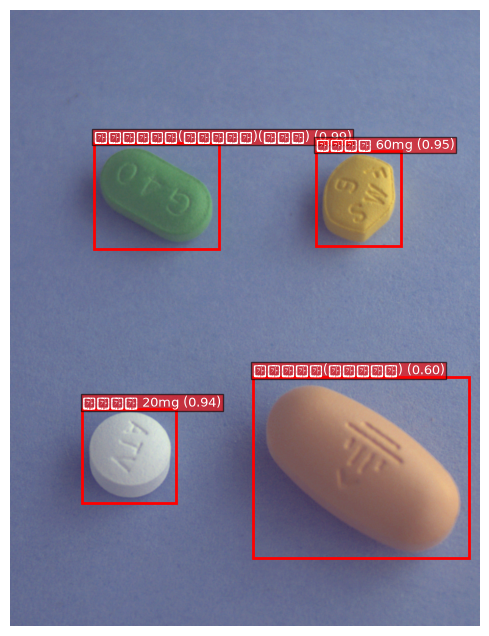

파일명: 1174


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 48148 (\N{HANGUL SYLLABLE BA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 50724 (\N{HANGUL SYLLABLE O}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47560 (\N{HANGUL SYLLABLE MA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 53076 (\N{HANGUL SYLLABLE KO}) missing from font

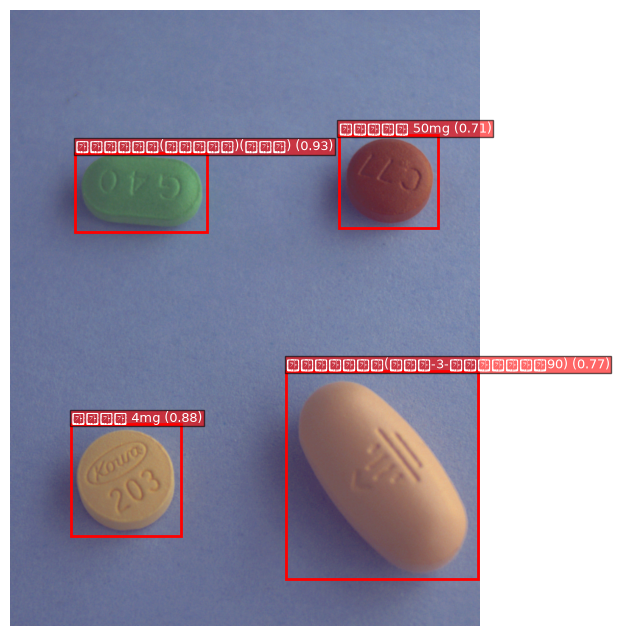

파일명: 1029


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 50577 (\N{HANGUL SYLLABLE YANG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 54616 (\N{HANGUL SYLLABLE HA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from fo

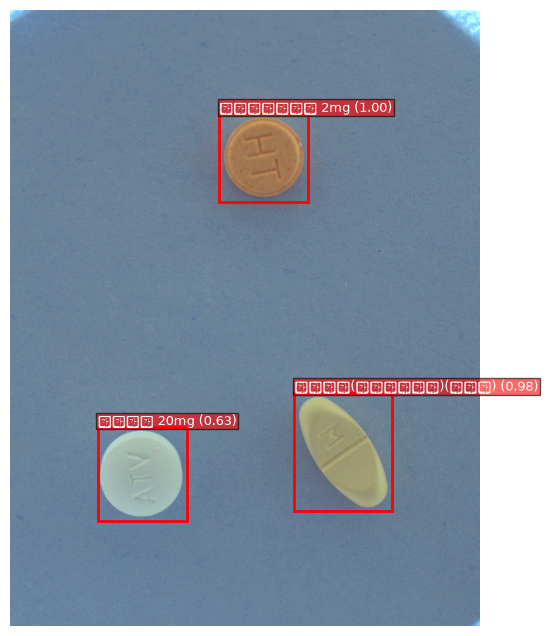

파일명: 875


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51648 (\N{HANGUL SYLLABLE JI}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 50508 (\N{HANGUL SYLLABLE AL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 49436 (\N{HANGUL SYLLABLE SEO}) missing from fo

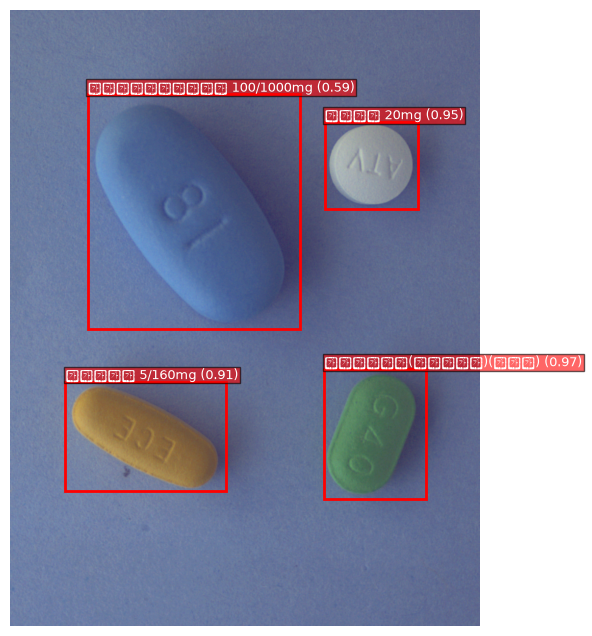

Test Inference:  20%|██        | 1/5 [00:01<00:07,  1.86s/it]

파일명: 1449


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47924 (\N{HANGUL SYLLABLE MU}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 53440 (\N{HANGUL SYLLABLE TA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47112 (\N{HANGUL SYLLABLE RE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 48120 (\N{HANGUL SYLLABLE MI}) missing from fon

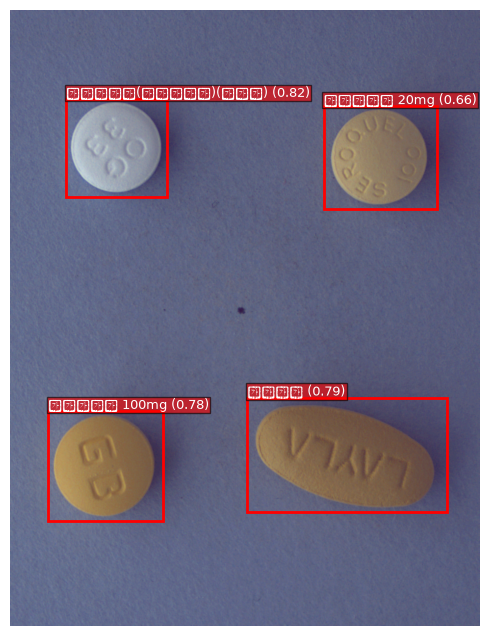

파일명: 1393


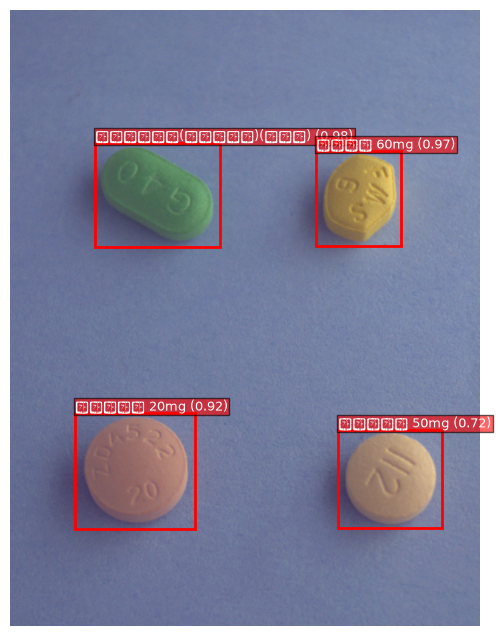

파일명: 1358


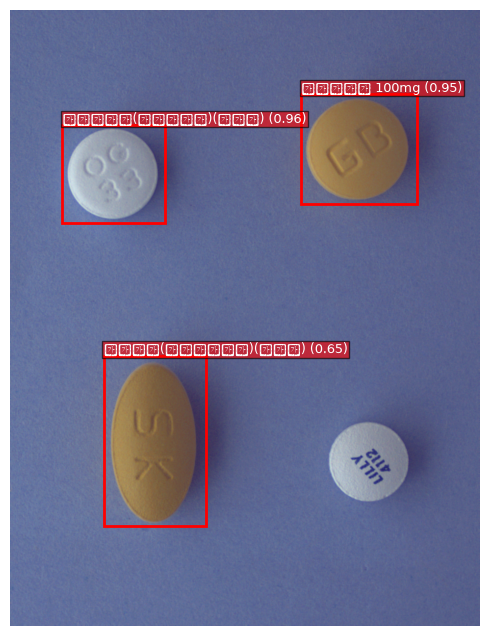

파일명: 1214


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 48036 (\N{HANGUL SYLLABLE MYU}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 46976 (\N{HANGUL SYLLABLE RAN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 53328 (\N{HANGUL SYLLABLE KYU}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47336 (\N{HANGUL SYLLABLE RU}) missing from 

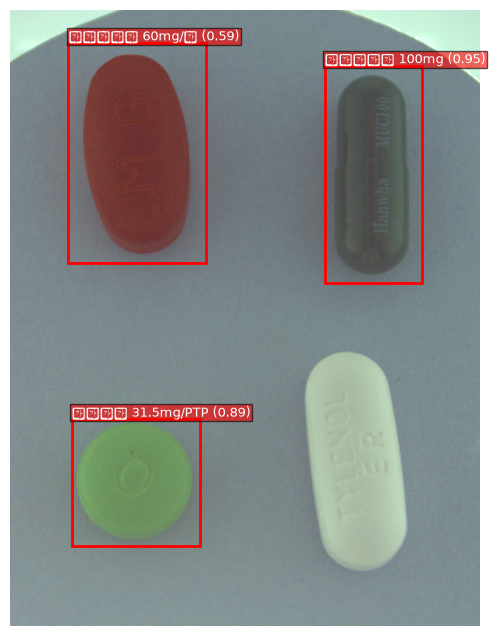

Test Inference:  40%|████      | 2/5 [00:03<00:05,  1.75s/it]

파일명: 868


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 46041 (\N{HANGUL SYLLABLE DONG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 54172 (\N{HANGUL SYLLABLE PEN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


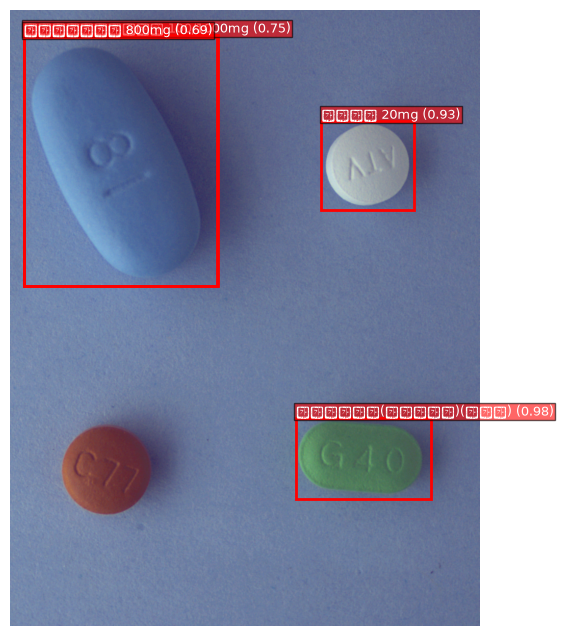

파일명: 1159


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51333 (\N{HANGUL SYLLABLE JONG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 44540 (\N{HANGUL SYLLABLE GEUN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 45817 (\N{HANGUL SYLLABLE DANG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 44544 (\N{HANGUL SYLLABLE GEUL}) missing 

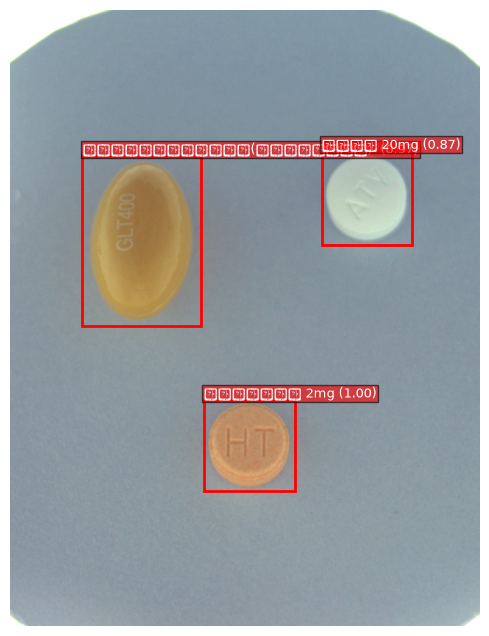

파일명: 742


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 45796 (\N{HANGUL SYLLABLE DA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 48372 (\N{HANGUL SYLLABLE BO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 48124 (\N{HANGUL SYLLABLE MIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


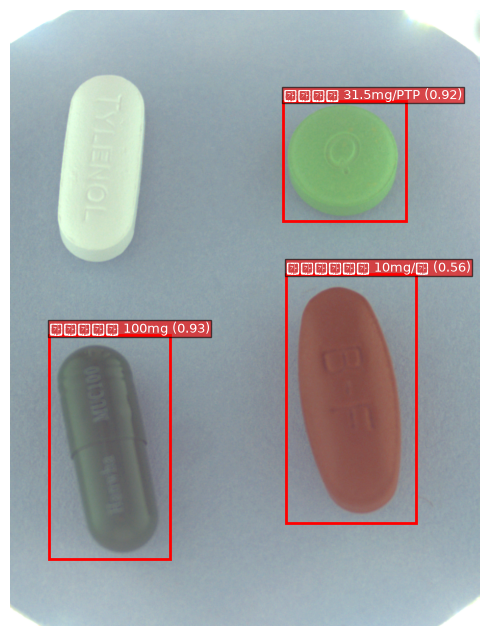

파일명: 874


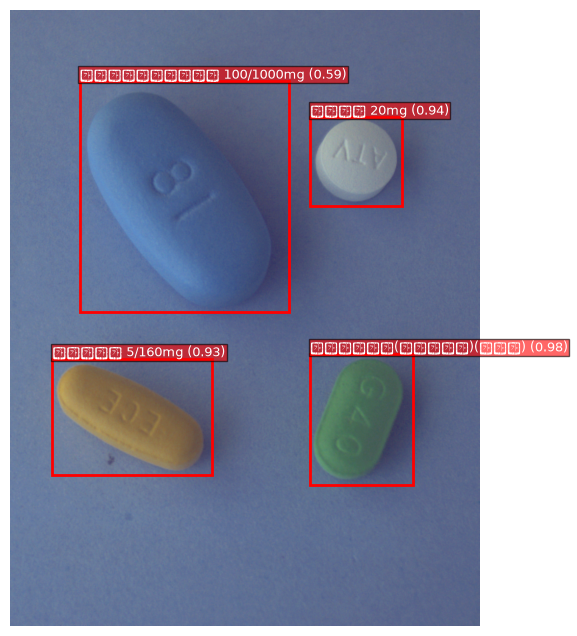

Test Inference:  60%|██████    | 3/5 [00:05<00:03,  1.73s/it]

파일명: 546


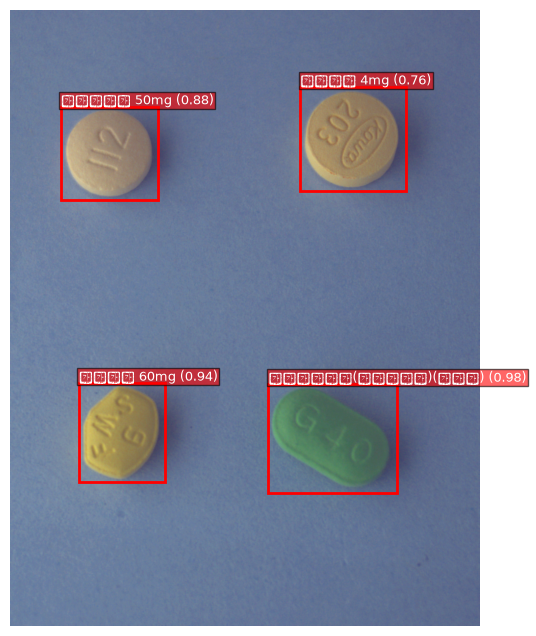

파일명: 1140


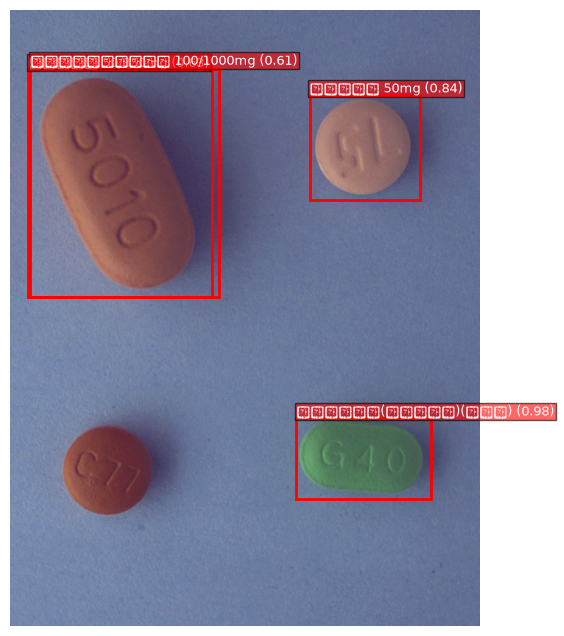

파일명: 612


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51232 (\N{HANGUL SYLLABLE JEN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 46272 (\N{HANGUL SYLLABLE DYU}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


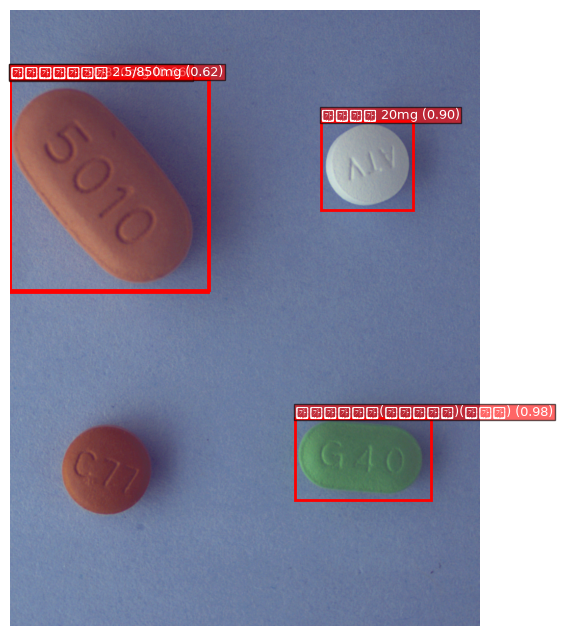

파일명: 346


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51228 (\N{HANGUL SYLLABLE JE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


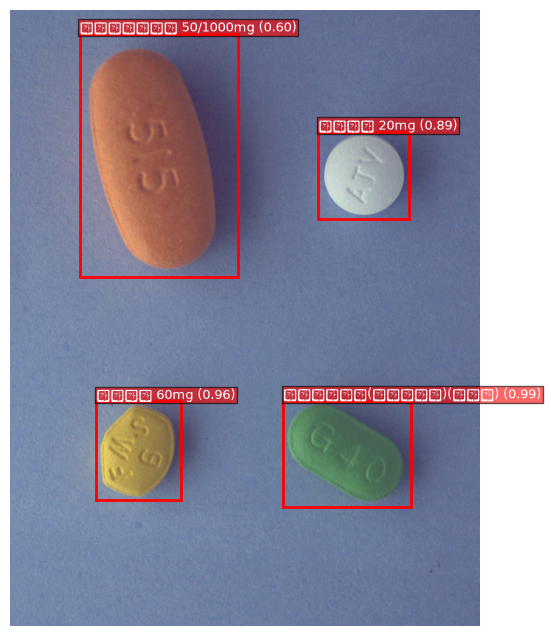

Test Inference:  80%|████████  | 4/5 [00:07<00:01,  1.77s/it]

파일명: 1044


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51247 (\N{HANGUL SYLLABLE JES}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


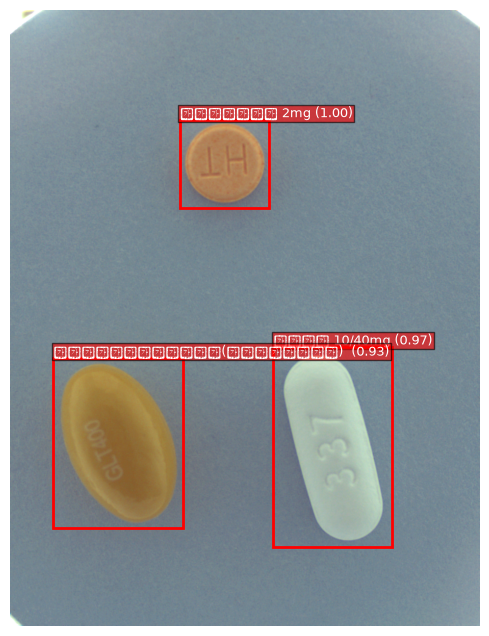

파일명: 1041


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47549 (\N{HANGUL SYLLABLE RIB}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47784 (\N{HANGUL SYLLABLE MO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 51096 (\N{HANGUL SYLLABLE JAL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 53444 (\N{HANGUL SYLLABLE TAN}) missing from 

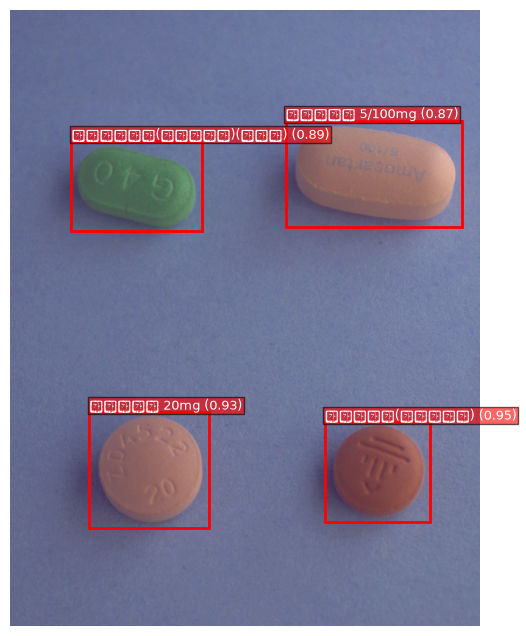

파일명: 1149


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 48156 (\N{HANGUL SYLLABLE BAL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


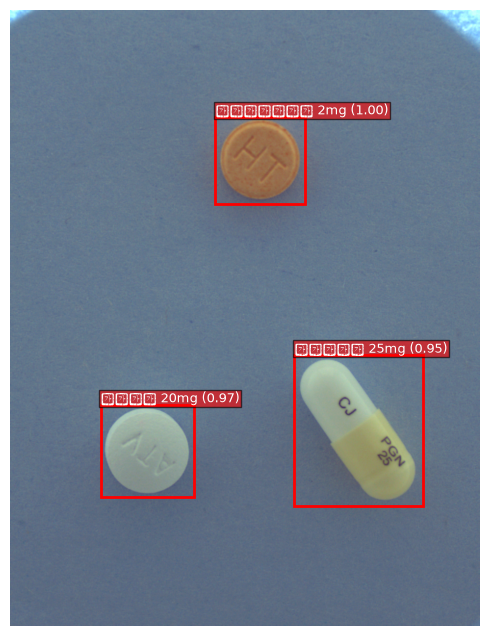

파일명: 1350


c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 47113 (\N{HANGUL SYLLABLE REG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 44600 (\N{HANGUL SYLLABLE GIL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 49892 (\N{HANGUL SYLLABLE SIL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\yiydg\Desktop\Vault_home\💼 Projects(Work)\Sprint AI_14기\workspace\프로젝트_초급\.venv\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 50864 (\N{HANGUL SYLLABLE U}) missing from f

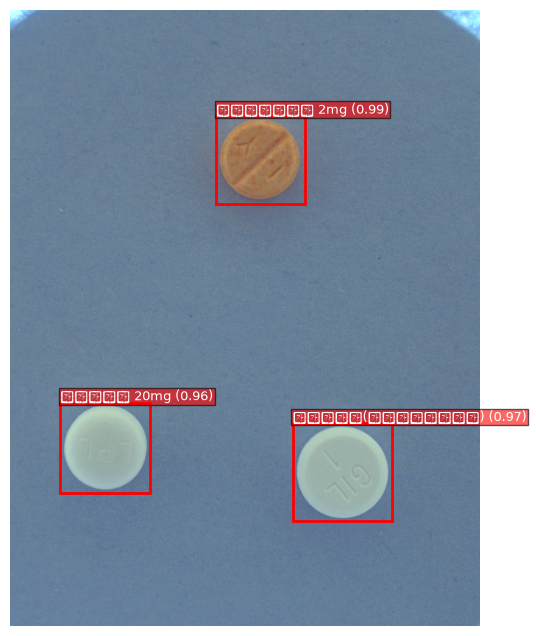

Test Inference: 100%|██████████| 5/5 [00:08<00:00,  1.77s/it]


In [ ]:
#@title Test 이미지 20장 추론 및 시각화
model.load_state_dict(torch.load(CHECKPOINT_PATH, map_location=device))
model.eval()

with torch.no_grad():
    for images, stems, orig_ws, orig_hs in tqdm(test_loader, desc="Test Inference"):
        images = [img.to(device) for img in images]
        predictions = model(images)

        for img, pred, stem, orig_w, orig_h in zip(images, predictions, stems, orig_ws, orig_hs):
            print(f"파일명: {stem}")
            visualize_prediction(img.cpu(), pred, classes)

In [ ]:
#@title Submission CSV 생성
model_name = "retinanet_resnet50_fpn_v2"

model.load_state_dict(torch.load(CHECKPOINT_PATH, map_location=device))
model.to(device)
model.eval()

all_test_paths = glob.glob(os.path.join(path, "test_images", "*.png"))
all_test_stems = [
    os.path.splitext(os.path.basename(p))[0]
    for p in all_test_paths
]

submission_test_dataset = TestDataset(
    image_dir=os.path.join(path, "test_images"),
    stems=all_test_stems,
    transforms=val_test_transformer
)

submission_test_loader = DataLoader(
    submission_test_dataset,
    batch_size=8,
    shuffle=False,
    collate_fn=lambda x: tuple(zip(*x))
)

rows = []
annotation_id = 1
score_thresh = 0.05

with torch.no_grad():
    for images, stems, orig_ws, orig_hs in tqdm(
        submission_test_loader,
        desc="Submission Inference"
    ):
        images = [img.to(device) for img in images]
        predictions = model(images)

        for pred, stem, orig_w, orig_h in zip(
            predictions, stems, orig_ws, orig_hs
        ):
            image_id = int(stem)

            boxes = pred["boxes"].cpu()
            labels = pred["labels"].cpu()
            scores = pred["scores"].cpu()

            keep = scores >= score_thresh
            boxes = boxes[keep]
            labels = labels[keep]
            scores = scores[keep]

            # 데이터 조건: 사진당 알약 최대 4개
            order = scores.argsort(descending=True)[:4]
            boxes = boxes[order]
            labels = labels[order]
            scores = scores[order]

            for box, label, score in zip(boxes, labels, scores):
                x_min, y_min, x_max, y_max = box.tolist()

                x_min = max(0, min(x_min, orig_w))
                x_max = max(0, min(x_max, orig_w))
                y_min = max(0, min(y_min, orig_h))
                y_max = max(0, min(y_max, orig_h))

                bbox_w = x_max - x_min
                bbox_h = y_max - y_min

                if bbox_w <= 0 or bbox_h <= 0:
                    continue

                rows.append([
                    annotation_id,
                    image_id,
                    label_to_category[label.item()],
                    round(x_min, 2),
                    round(y_min, 2),
                    round(bbox_w, 2),
                    round(bbox_h, 2),
                    round(score.item(), 4),
                ])
                annotation_id += 1

submission_filename = f"submission_{model_name}.csv"

with open(submission_filename, "w", newline="", encoding="utf-8") as f:
    writer = csv.writer(f)
    writer.writerow([
        "annotation_id", "image_id", "category_id",
        "bbox_x", "bbox_y", "bbox_w", "bbox_h", "score"
    ])
    writer.writerows(rows)

print(f"총 {len(rows)}개 예측 저장 완료 → {submission_filename}")

Submission Inference: 100%|██████████| 106/106 [01:39<00:00,  1.07it/s]

총 3368개 예측 저장 완료 → submission_retinanet_resnet50_fpn_v2.csv


In [ ]:
#@title label_to_category 매핑 자체 검증
expected_labels = set(range(1, num_classes))  # background(0) 제외
mapped_labels = set(label_to_category.keys())

print(f"모델이 출력 가능한 라벨 범위: {expected_labels}")
print(f"label_to_category에 존재하는 라벨: {mapped_labels}")
print(f"매핑 누락된 라벨: {expected_labels - mapped_labels}")
print(f"매핑 결과 category_id 샘플 5개: {list(label_to_category.items())[:5]}")

모델이 출력 가능한 라벨 범위: {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56}
label_to_category에 존재하는 라벨: {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56}
매핑 누락된 라벨: set()
매핑 결과 category_id 샘플 5개: [(1, 1900), (2, 2483), (3, 3351), (4, 3483), (5, 3544)]
